In [1]:
import pandas as pd

data = pd.read_feather("D:/Desktop/ubiquant/ubiquant_data.feather")
data.set_index(["time_id", "investment_id"], inplace=True)
data.index.names = ["datetime", "instrument"]

In [2]:
X_test = data[data.index.get_level_values(0) >= 1000]
y_test = X_test.pop("target")
X_train = data[~data.index.isin(X_test.index)]
y_train = X_train.pop("target")

In [3]:
import scutquant.scutquant as q

X_train = q.zscorenorm(X_train, X_train.groupby("datetime").mean(), X_train.groupby("datetime").std())
y_train = q.zscorenorm(y_train, y_train.groupby("datetime").mean(), y_train.groupby("datetime").std())

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:   17.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:   18.2s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:   25.5s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:   32.7s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:   39.4s
[Parallel(n_jobs=-1)]: Done  81 tasks      | elapsed:   46.8s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:   50.6s
[Parallel(n_jobs=-1)]: Done 113 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 149 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 189 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 210 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 233 tasks      | elapsed:  

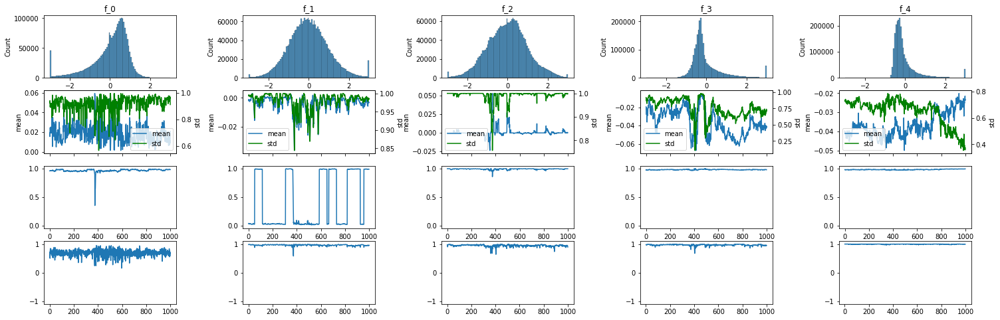

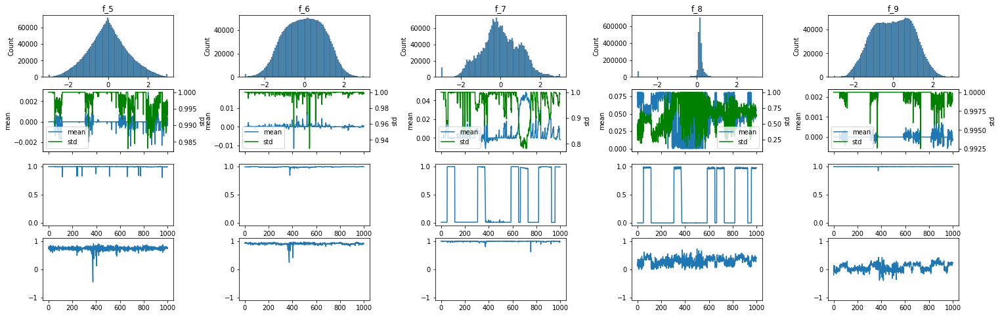

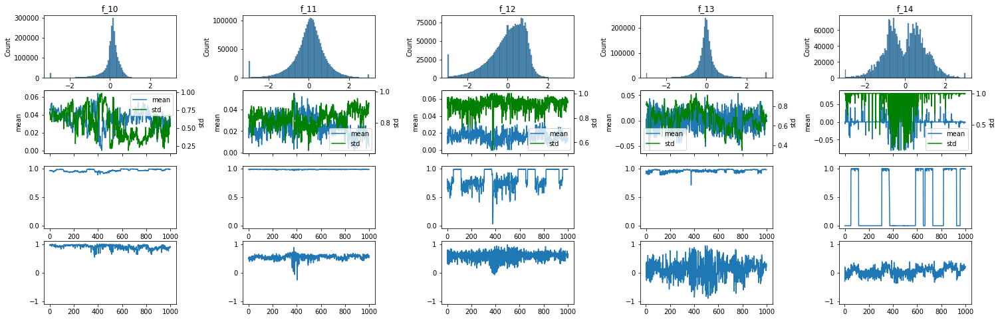

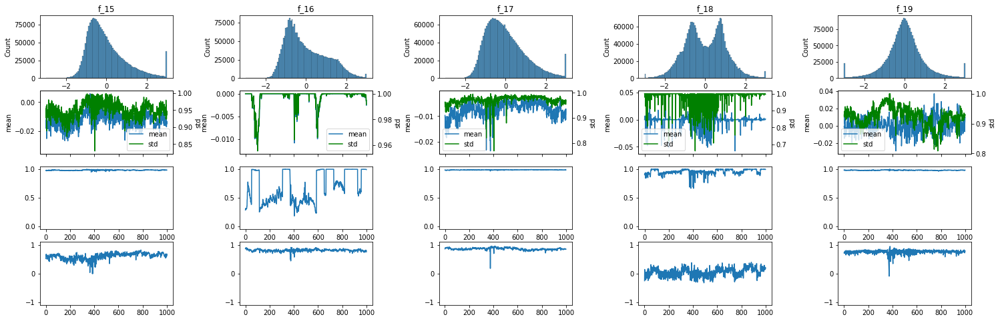

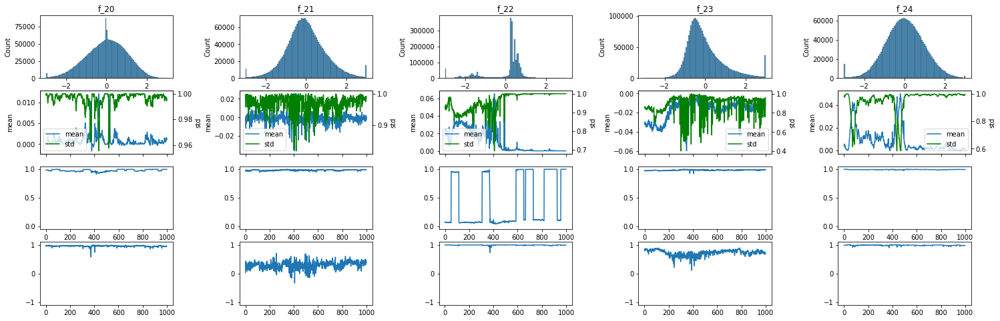

...

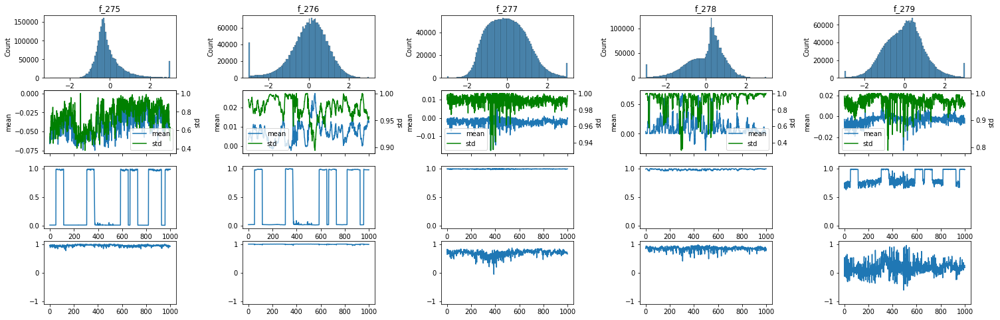

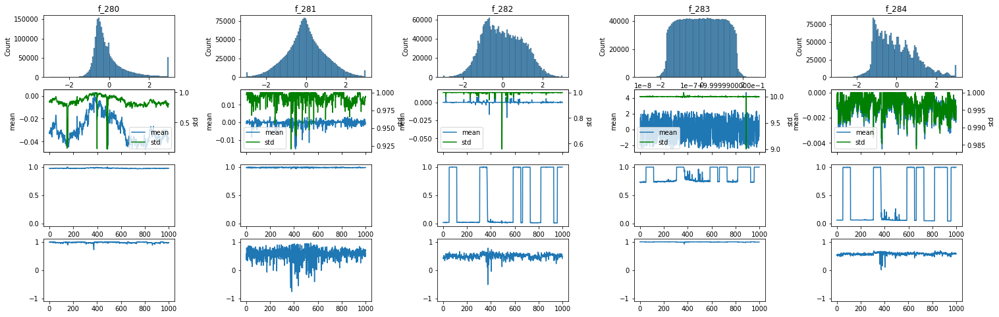

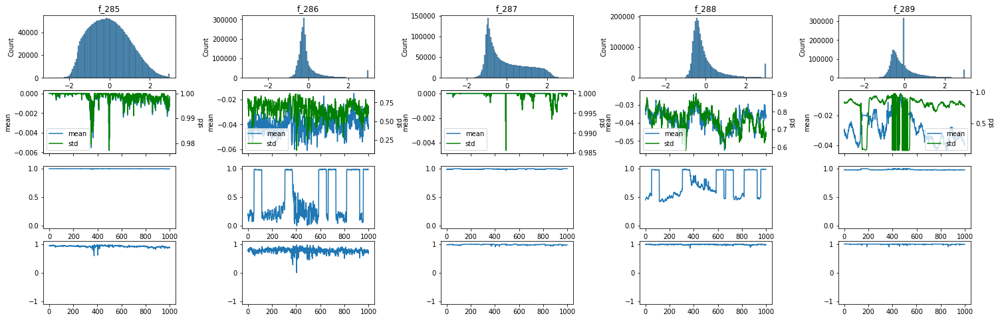

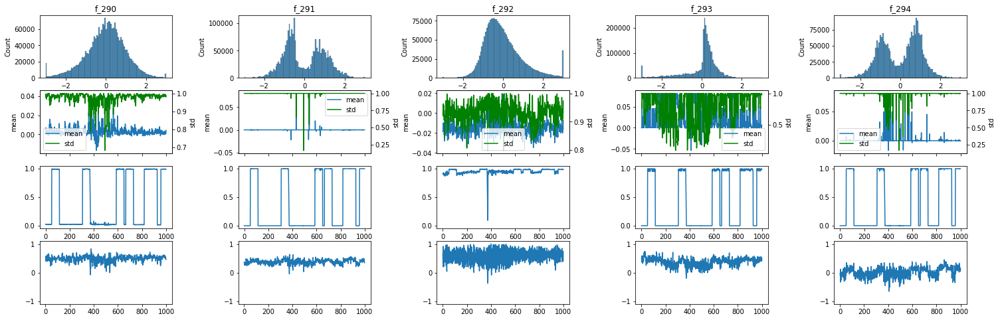

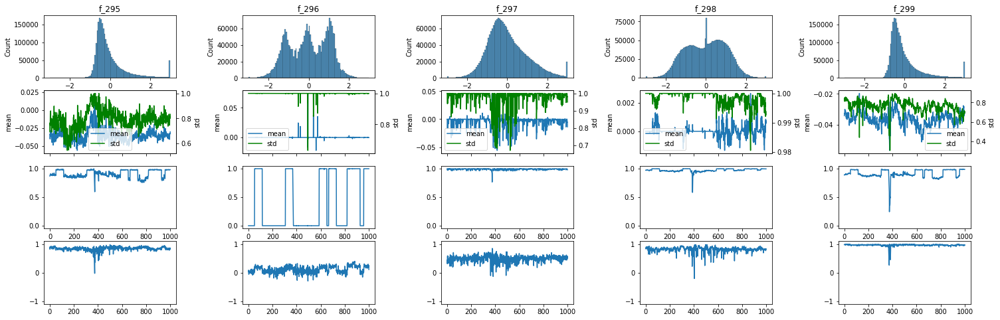

In [4]:
from functools import partial
from qlib.contrib.report.data.ana import CombFeaAna, FeaDistAna, FeaNanAnaRatio, FeaInfAna, FeaMeanStd, ValueCNT, FeaACAna, RawFeaAna

fa_full = CombFeaAna(X_train, FeaDistAna, FeaMeanStd, partial(ValueCNT, ratio=True), FeaACAna)
fa_full.plot_all(sub_fs=(5, 2), col_n=5, wspace=0.5)

<AxesSubplot:xlabel='datetime'>

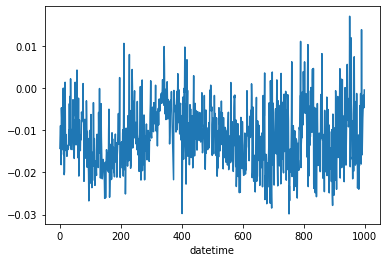

In [5]:
label_mean = y_train.groupby("datetime").mean()
label_std = y_train.groupby("datetime").std()
label_mean.plot()

<AxesSubplot:xlabel='datetime'>

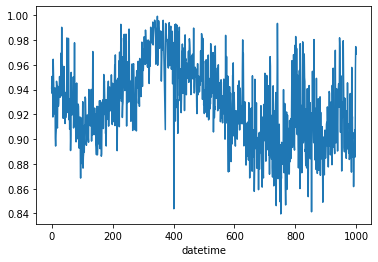

In [6]:
label_std.plot()

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:   17.1s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:   18.7s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:   25.8s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:   32.2s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:   39.0s
[Parallel(n_jobs=-1)]: Done  81 tasks      | elapsed:   46.2s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:   49.3s
[Parallel(n_jobs=-1)]: Done 113 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 135 out of 150 | elapsed:  1.2min remaining:    7.7s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:  1.2min finished


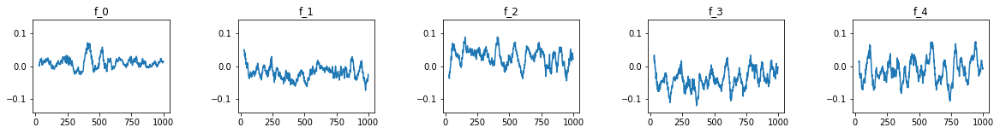

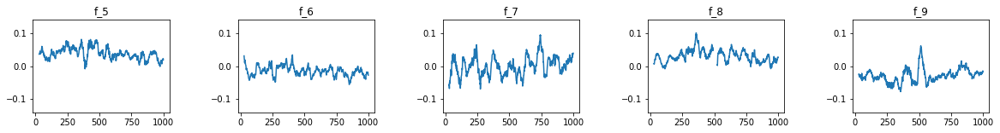

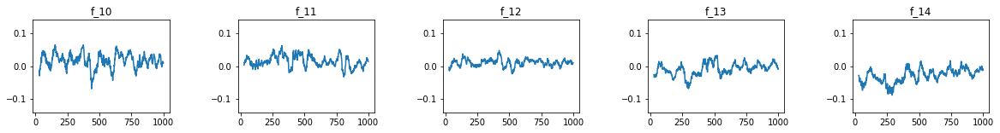

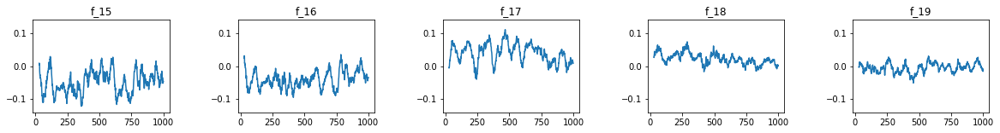

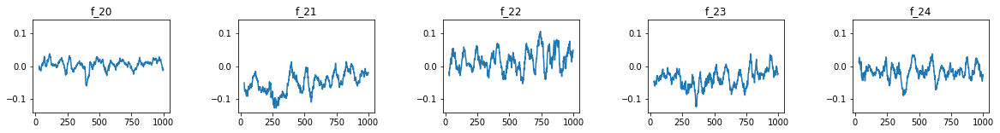

...

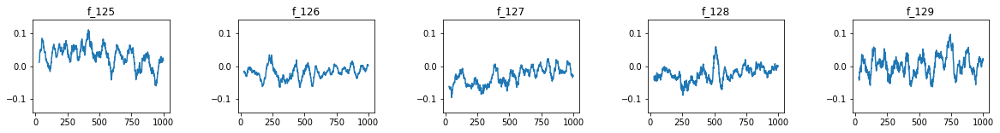

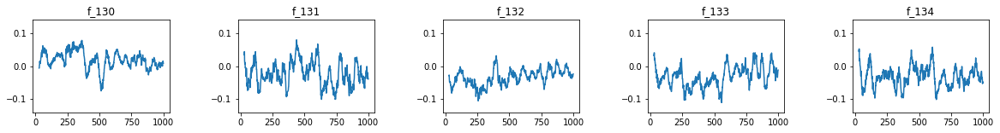

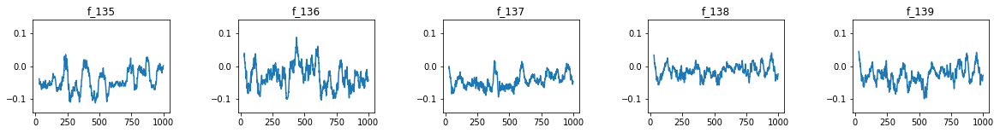

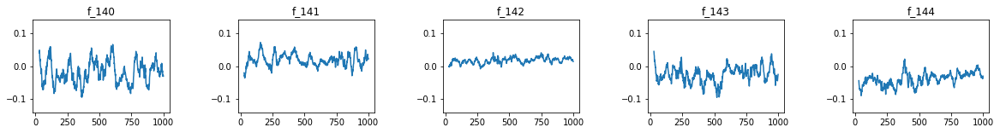

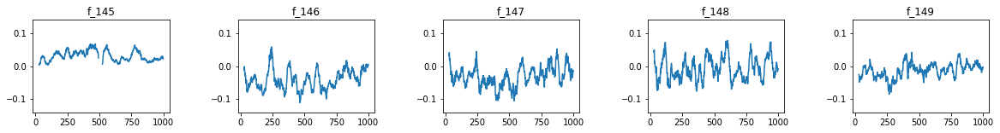

In [7]:
from qlib.contrib.eva.alpha import calc_all_ic

fea_0_150 = X_train.iloc[:, :150]
all_ic_1 = calc_all_ic(fea_0_150.to_dict('series'), y_train)
all_ic_df_1 = pd.concat({f: d['ic'] for f, d in all_ic_1.items()})
all_ic_df_1 = all_ic_df_1.unstack(0)

fa = RawFeaAna(all_ic_df_1.rolling(30).mean())
fa.plot_all(sub_fs=(4, 2), col_n=5, wspace=0.5)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:   14.1s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:   16.3s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:   22.5s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:   29.4s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:   34.7s
[Parallel(n_jobs=-1)]: Done  81 tasks      | elapsed:   39.7s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:   47.2s
[Parallel(n_jobs=-1)]: Done 113 tasks      | elapsed:   54.6s
[Parallel(n_jobs=-1)]: Done 135 out of 150 | elapsed:  1.1min remaining:    7.3s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:  1.2min finished


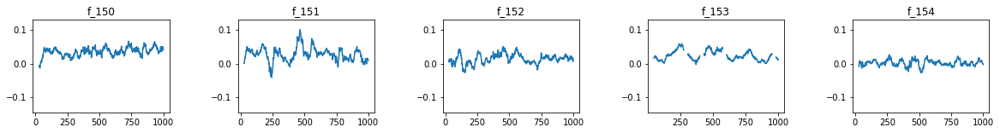

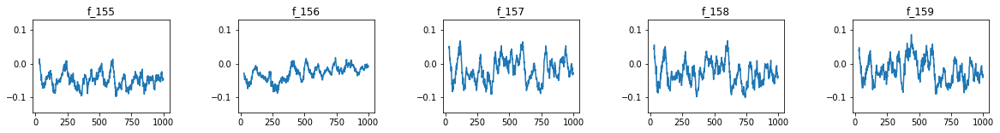

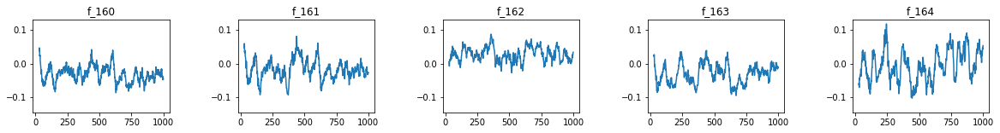

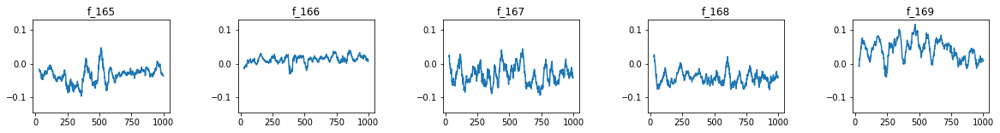

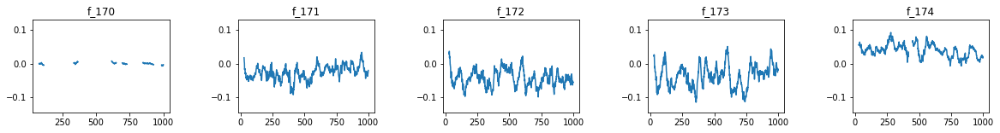

...

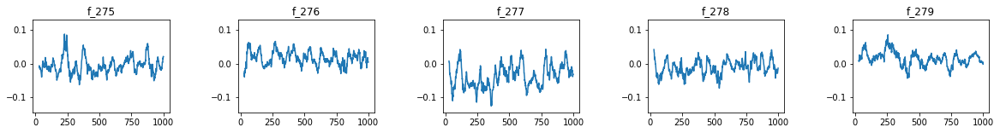

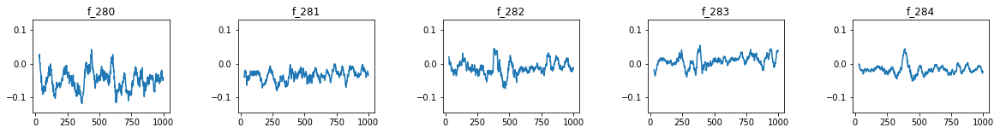

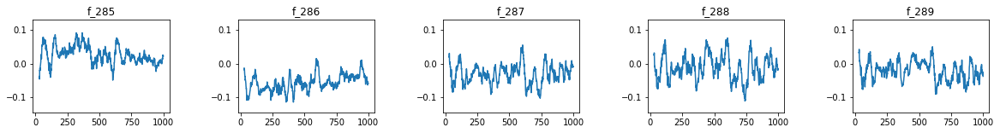

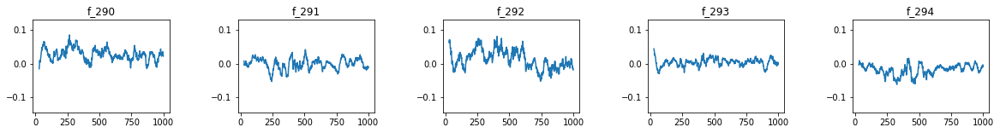

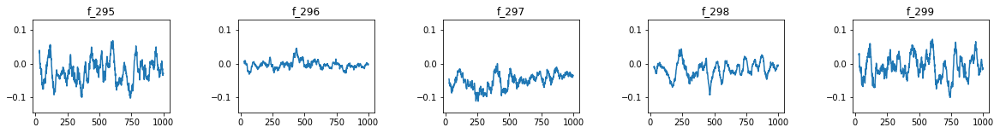

In [8]:
fea_151_300 = X_train.iloc[:, 150:300]
all_ic_2 = calc_all_ic(fea_151_300.to_dict('series'), y_train)
all_ic_df_2 = pd.concat({f: d['ic'] for f, d in all_ic_2.items()})
all_ic_df_2 = all_ic_df_2.unstack(0)

fa = RawFeaAna(all_ic_df_2.rolling(30).mean())
fa.plot_all(sub_fs=(4, 2), col_n=5, wspace=0.5)

In [9]:
all_ic = pd.concat([all_ic_df_1, all_ic_df_2], axis=0)
abs(all_ic.mean()).mean()

0.024335976577974903

In [10]:
time = 1000
ic_performance = pd.DataFrame({"ic_mean": all_ic.mean(), "icir": all_ic.mean() / all_ic.std()})
ic_performance["t-stat"] = ic_performance["icir"] * (time ** 0.5)
ic_performance.to_csv("factors_ic.csv")
ic_performance

,ic_mean,icir,t-stat
f_0,0.009971,0.135371,4.280814
f_1,-0.018735,-0.191996,-6.071438
f_2,0.025432,0.209044,6.610562
f_3,-0.037755,-0.269979,-8.537488
f_4,-0.010591,-0.072859,-2.304011
...,...,...,...
f_295,-0.020299,-0.127470,-4.030959
f_296,-0.003290,-0.055506,-1.755241
f_297,-0.051122,-0.501057,-15.844828
f_298,-0.016821,-0.220984,-6.988133


<AxesSubplot:>

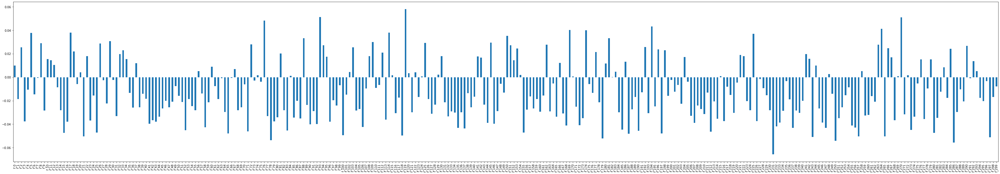

In [11]:
fig = all_ic.mean().plot(kind='bar', figsize=(60, 10))
fig.figure.savefig('ic_mean.png')
fig

Accuracy of Prediction: 0.5396959320618492


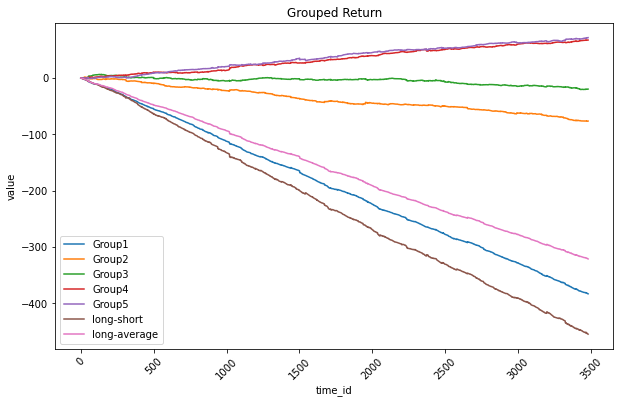

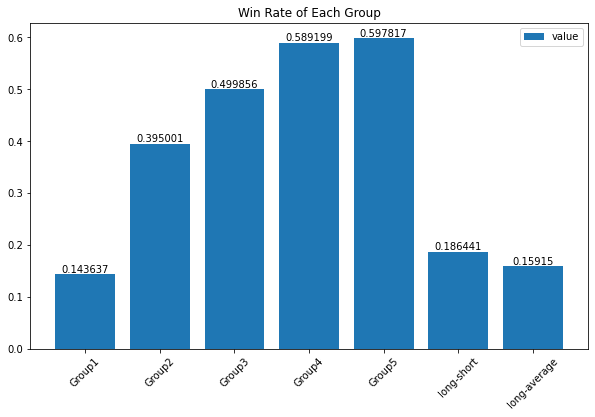

In [12]:
from scutquant import report

factor = pd.Series(X_train["f_231"].values, name="predict", index=X_train.index)
report.group_return_ana(factor, y_train, groupby="instrument")

Accuracy of Prediction: 0.5003431593344271


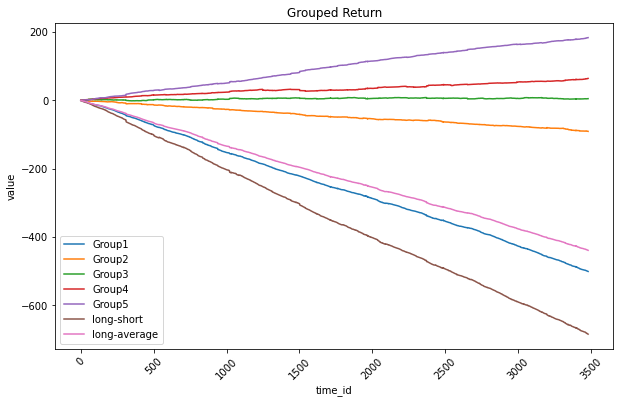

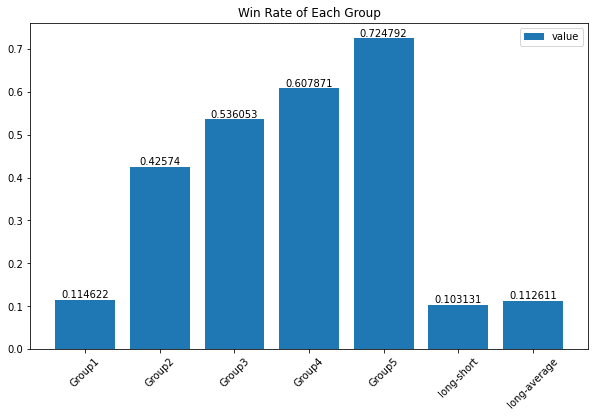

In [13]:
factors_sum = X_train.sum(axis=1)
factor = pd.Series(factors_sum.values, name="predict", index=X_train.index)
report.group_return_ana(factor, y_train, groupby="instrument")